In [489]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import pandas as pd
from sklearn.model_selection import train_test_split


POI_FILENAME = "../data/poi-paris.pkl"
parismap = mpimg.imread('../data/paris-48.806-2.23--48.916-2.48.jpg')
## coordonnees GPS de la carte
xmin, xmax = 2.23, 2.48  # coord_x min et max
ymin, ymax = 48.806, 48.916  # coord_y min et max
coords = [xmin, xmax, ymin, ymax]


class Density(object):
    def fit(self,data):
        pass
    def predict(self,data):
        pass
    def score(self,data):
        data = self.predict(data)
        data[np.where(data == 0)] = 1e-10
        return np.log(data).sum()
        #return np.log( np.where(data == 0, 1e-10, data) ).sum()

class Histogramme(Density):
    
    def __init__(self,steps=10):
        Density.__init__(self)
        self.steps = steps
        
    def fit(self,x):
        #A compléter : apprend l'histogramme de la densité sur x
        self.densite,self.edge = np.histogramdd(x,[self.steps] * x.shape[-1])
        self.densite /= x.shape[0]
    
    """def predict(self,x):
        #A compléter : retourne la densité associée à chaque point de x
        densite,edge = self.fit(x)
        res = []
        for i in x :
            d1 = 0;
            d2 = 0;
            
            for j in range(len(i)) :
                for bins in range(1,len(edge[j])) :
                    if i[j] <= edge[j][bins] :
                        if j == 0 :
                            d1 = bins - 1
                        else :
                            d2 = bins - 1
                        break
            res.append(densite[d1][d2])
        return np.array(res)
        """
    def predict(self, x):
    # Apprend l'histogramme de densité sur x
        densite, edge = self.densite,self.edge
        res = []
        # Pour chaque point de données dans x
        for i in x:
            d1 = -1
            d2 = -1
            #print("i : ",i)

            # Pour chaque dimension du point de données
            for j in range(len(i)):
                # Parcourir les bornes des bins dans la dimension j
                #print("edge : ",edge[j])
                for bins in range(1, len(edge[j])):
                    # Trouver l'indice du bin correspondant au point de données dans la dimension j
                    if i[j] <= edge[j][bins]:
                        if j == 0:
                            d1 = bins - 1
                        else:
                            d2 = bins - 1
                        break  # Sortir de la boucle une fois que l'indice du bin est trouvé
            # Ajouter la densité associée au point de données à la liste des résultats
            if d1 == -1 or d2 == -1 :
                res.append(0)
                continue
            res.append(densite[d1][d2])

        # Convertir la liste des résultats en un tableau NumPy et la retourner
        return np.array(res)


def get_density2D(f,data,steps=100):
    """ Calcule la densité en chaque case d'une grille steps x steps dont les bornes sont calculées à partir du min/max de data. Renvoie la grille estimée et la discrétisation sur chaque axe.
    """
    xmin, xmax = data[:,0].min(), data[:,0].max()
    ymin, ymax = data[:,1].min(), data[:,1].max()
    xlin,ylin = np.linspace(xmin,xmax,steps),np.linspace(ymin,ymax,steps)
    xx, yy = np.meshgrid(xlin,ylin)
    grid = np.c_[xx.ravel(), yy.ravel()]
    res = f.predict(grid).reshape(steps, steps)
    return res, xlin, ylin

def show_density(f, data, steps=100, log=False):
    """ Dessine la densité f et ses courbes de niveau sur une grille 2D calculée à partir de data, avec un pas de discrétisation de steps. Le paramètre log permet d'afficher la log densité plutôt que la densité brute
    """
    res, xlin, ylin = get_density2D(f, data, steps)
    xx, yy = np.meshgrid(xlin, ylin)
    plt.figure()
    show_img()
    if log:
        res = np.log(res+1e-10)
    plt.scatter(data[:, 0], data[:, 1], alpha=0.8, s=3)
    show_img(res)
    plt.colorbar()
    plt.contour(xx, yy, res, 20)


def show_img(img=parismap):
    """ Affiche une matrice ou une image selon les coordonnées de la carte de Paris.
    """
    origin = "lower" if len(img.shape) == 2 else "upper"
    alpha = 0.3 if len(img.shape) == 2 else 1.
    plt.imshow(img, extent=coords, aspect=1.5, origin=origin, alpha=alpha)
    ## extent pour controler l'echelle du plan


def load_poi(typepoi,fn=POI_FILENAME):
    """ Dictionaire POI, clé : type de POI, valeur : dictionnaire des POIs de ce type : (id_POI, [coordonnées, note, nom, type, prix])
    
    Liste des POIs : furniture_store, laundry, bakery, cafe, home_goods_store, 
    clothing_store, atm, lodging, night_club, convenience_store, restaurant, bar
    """
    poidata = pickle.load(open(fn, "rb"))
    data = np.array([[v[1][0][1],v[1][0][0]] for v in sorted(poidata[typepoi].items())])
    note = np.array([v[1][1] for v in sorted(poidata[typepoi].items())])
    return data,note


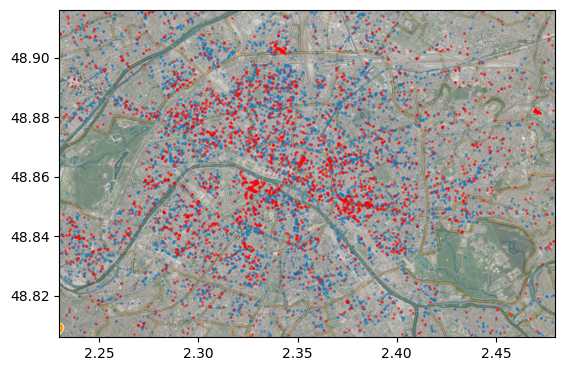

In [366]:
plt.ion()
# Liste des POIs : furniture_store, laundry, bakery, cafe, home_goods_store, clothing_store, atm, lodging, night_club, convenience_store, restaurant, bar
# La fonction charge la localisation des POIs dans geo_mat et leur note.
geo_mat, notes = load_poi("bar")
# Affiche la carte de Paris
show_img()
# Affiche les POIs
plt.scatter(geo_mat[:,0],geo_mat[:,1],alpha=0.5,s=1)

geo_mat, notes = load_poi("furniture_store")
plt.scatter(geo_mat[:,0],geo_mat[:,1],alpha=0.5,s=1,color = "red")


In [368]:
poidata = pickle.load(open(POI_FILENAME, "rb"))

In [369]:
poidata.keys()

dict_keys(['furniture_store', 'laundry', 'bakery', 'cafe', 'home_goods_store', 'clothing_store', 'atm', 'lodging', 'night_club', 'convenience_store', 'restaurant', 'bar'])

In [370]:
poidata['furniture_store']["ChIJvQW3LzBu5kcR1K1RinPHWuo"]

((48.86663159999999, 2.3316366),
 2.2,
 'Unopiu',
 ['furniture_store',
  'home_goods_store',
  'store',
  'point_of_interest',
  'establishment'],
 -1)

In [371]:
histo = Histogramme(10)
histo.fit(geo_mat)

In [372]:
res = histo.predict(geo_mat)

In [373]:
geo_mat.shape

(2721, 2)

In [374]:
res.shape

(2721,)

In [376]:
x,y,z = get_density2D(histo,geo_mat,steps=10)

In [377]:
x,y,z

(array([[0.0029401 , 0.00367512, 0.0029401 , 0.00441014, 0.00147005,
         0.00441014, 0.00551268, 0.0029401 , 0.00330761, 0.00147005],
        [0.00404263, 0.00183756, 0.0062477 , 0.01029033, 0.00441014,
         0.00845277, 0.00220507, 0.00330761, 0.        , 0.00147005],
        [0.01506799, 0.00147005, 0.01506799, 0.02058067, 0.00698273,
         0.00771775, 0.01102536, 0.        , 0.        , 0.0029401 ],
        [0.01286292, 0.01249541, 0.0275634 , 0.02425579, 0.01764057,
         0.01617053, 0.0216832 , 0.0062477 , 0.00661521, 0.00330761],
        [0.        , 0.01212789, 0.01690555, 0.03932378, 0.0338111 ,
         0.04116134, 0.03123852, 0.01359794, 0.00845277, 0.00220507],
        [0.        , 0.00330761, 0.01433297, 0.01286292, 0.03564866,
         0.03601617, 0.01470048, 0.00551268, 0.01029033, 0.00220507],
        [0.00441014, 0.00845277, 0.03160603, 0.03123852, 0.02425579,
         0.01029033, 0.0091878 , 0.00698273, 0.0062477 , 0.01580301],
        [0.00477766, 0.0051

In [378]:
x.shape

(10, 10)

In [380]:
x.sum()

0.9999999999999999

In [389]:
geo_mat, notes = load_poi("bar")

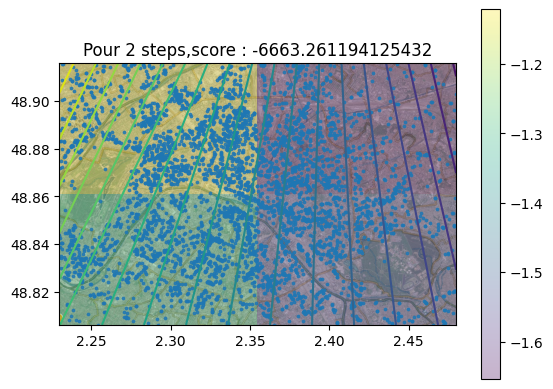

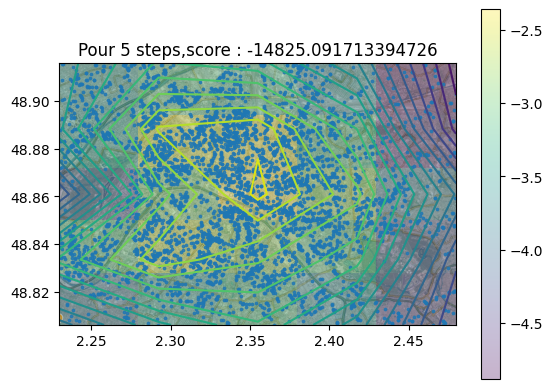

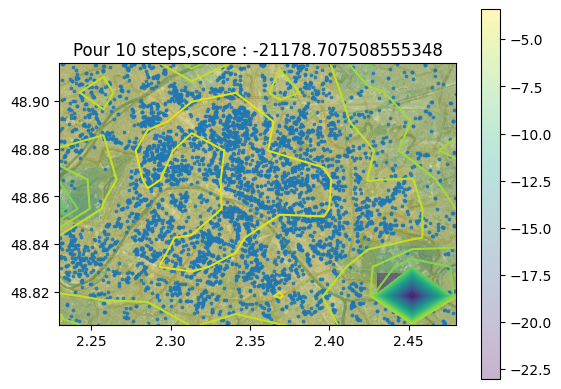

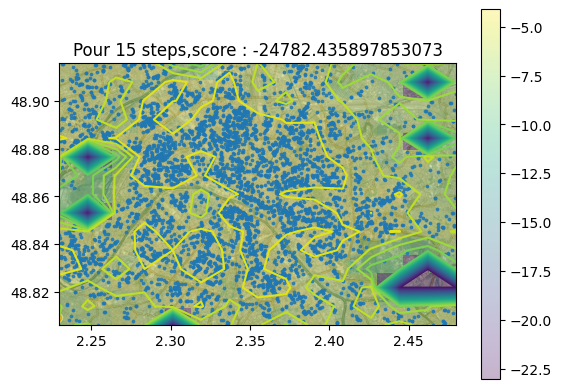

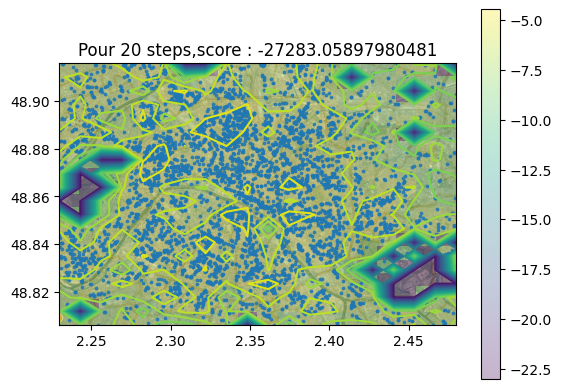

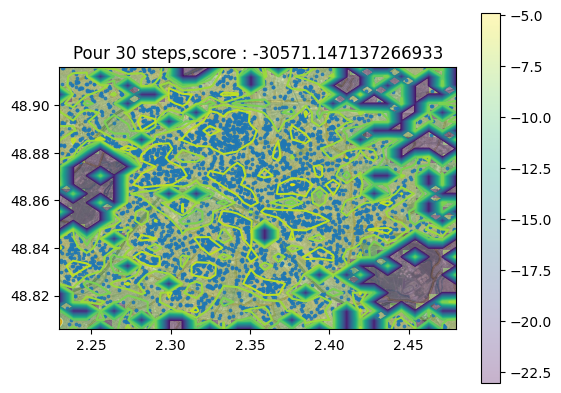

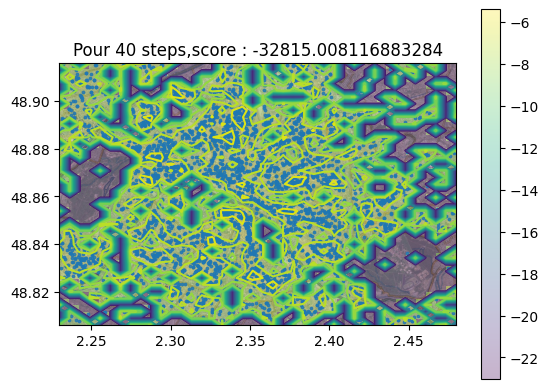

In [419]:
for steps in [2, 5, 10, 15, 20, 30, 40]:
    histo = Histogramme(steps)
    histo.fit(geo_mat)
    show_density(histo,geo_mat,steps,log = True)
    plt.title(f"Pour {steps} steps,score : {histo.score(geo_mat)}")

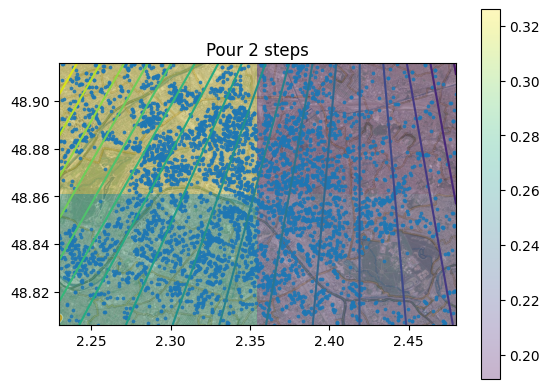

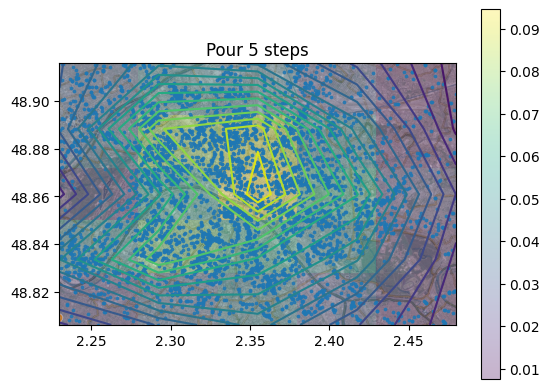

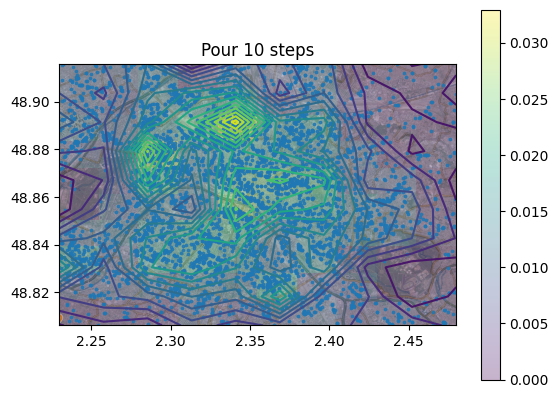

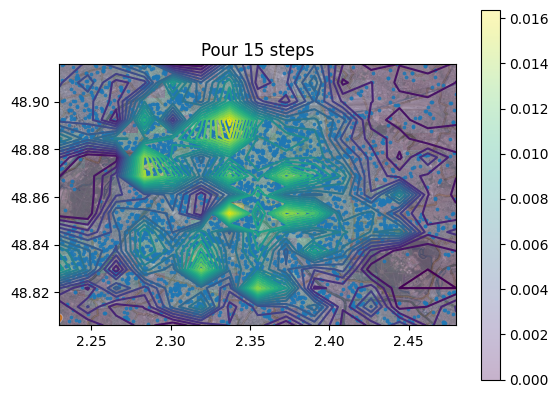

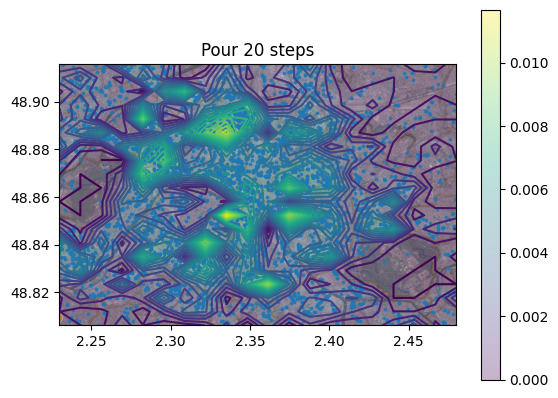

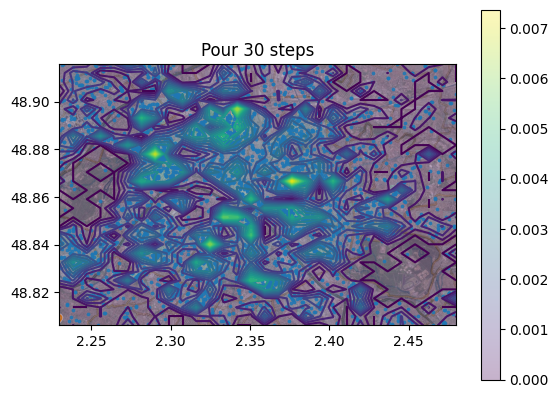

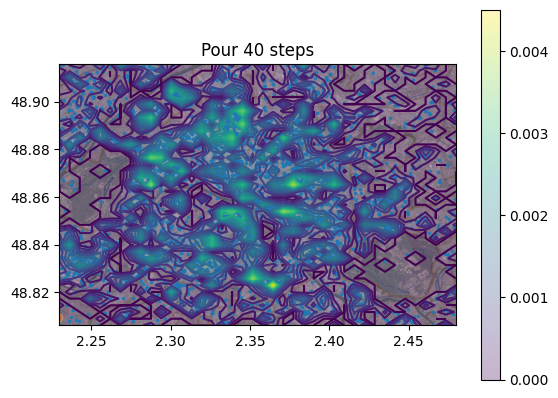

In [399]:
for steps in [2, 5, 10, 15, 20, 30, 40]:
    histo = Histogramme(steps)
    histo.fit(geo_mat)
    show_density(histo,geo_mat,steps)
    plt.title(f"Pour {steps} steps")

## Training Set

In [413]:
train_set = geo_mat[:int(0.5 * geo_mat.shape[0])]

In [414]:
train_set.shape

(2444, 2)

In [437]:
histogramme = Histogramme(5)

In [438]:
histogramme.fit(train_set)

In [439]:
test_set = geo_mat[int(0.5 * geo_mat.shape[0]) : ]

In [440]:
histogramme.score(test_set)

-7423.834001768964

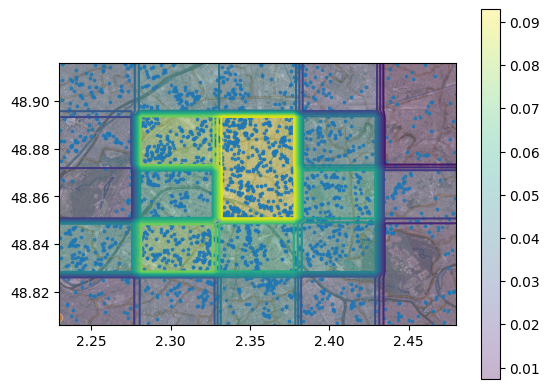

In [441]:
show_density(histogramme,train_set,steps)

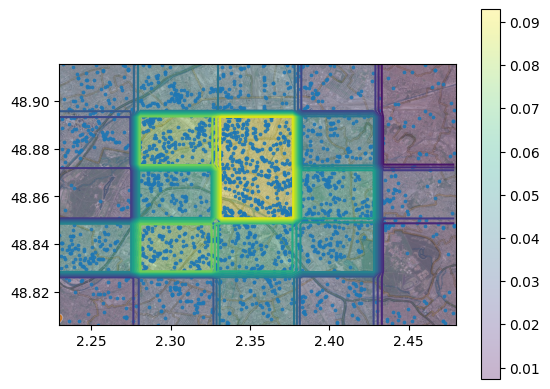

In [442]:
show_density(histogramme,test_set,steps)

# Méthode de Noyau

In [515]:
class KernelDensity(Density):
    
    def __init__(self,kernel=None,sigma=0.1):
        Density.__init__(self)
        self.kernel = kernel
        self.sigma = sigma
    
    def fit(self,x):
        self.x = x
    
    def predict(self,data):
        #A compléter : retourne la densité associée à chaque point de data
        res = []
        part1 = 1 / (self.x.shape[0] * (self.sigma ** self.x.shape[-1])) 
        for x0 in data :
            x0 = np.tile(x0,(self.x.shape[0],1))
            res.append(part1 * np.sum(self.kernel((x0 - self.x) / self.sigma)))

        return np.array(res)
    
def kernel_uniform(x):
    res = []
    for k in np.abs(x) <= 0.5 :
        if False in k :
            res.append(0)
            continue
        res.append(1)
    return np.array(res)

def kernel_gaussian(x):
    return (2 * np.pi) ** (x.shape[-1] / 2) * np.exp(-1 / 2 * ((x**2).sum()))

### Uniforme

In [495]:
kernelUniform = KernelDensity(kernel=kernel_uniform)

In [496]:
train_data, test_data = train_test_split(geo_mat, test_size=0.2, random_state=42)

# Créez une instance de votre classe KernelDensity avec le noyau uniforme
kernelUniform = KernelDensity(kernel=kernel_uniform)

# Ajustez le modèle aux données d'entraînement
kernelUniform.fit(train_data)

# Estimez les densités de probabilité sur les données de test
densities_test = kernelUniform.predict(test_data)

In [497]:
densities_test.sum()

35780.66496163682

In [479]:
geo_mat.shape

(4888, 2)

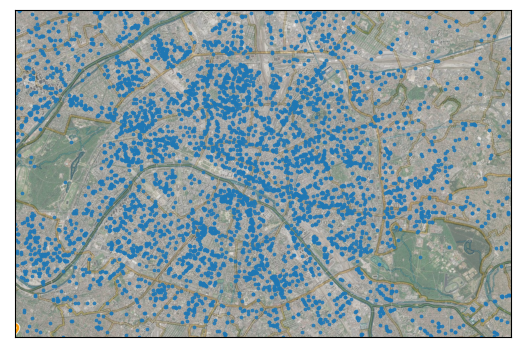

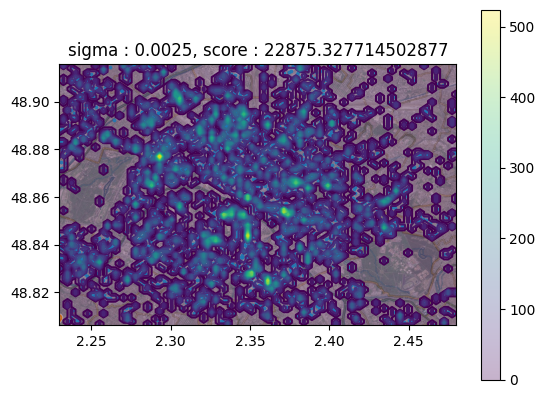

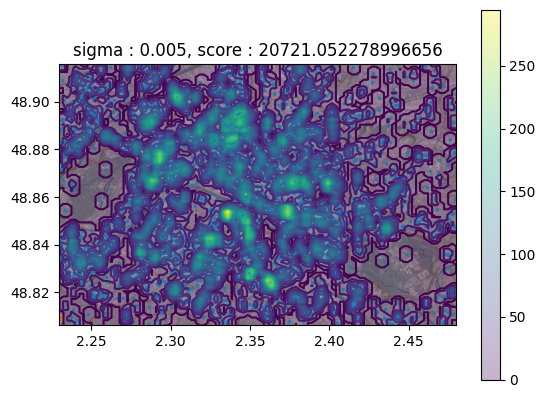

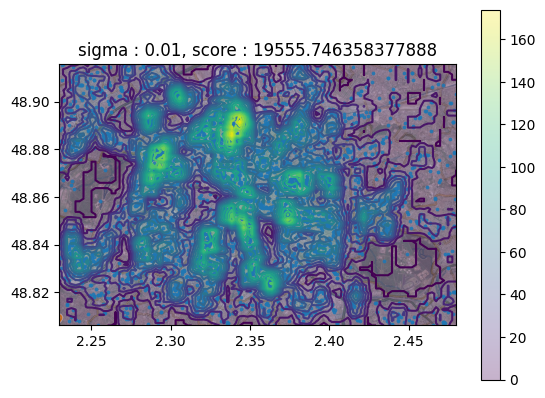

In [517]:
show_img()
# Affiche les POIs
plt.scatter(geo_mat[:,0],geo_mat[:,1],alpha=0.8,s=3)
plt.xticks([])
plt.yticks([])

for sigma in [0.0025, 0.005, 0.01]:
    nc_kernelDensity = KernelDensity(kernel=kernel_uniform, sigma=sigma)
    nc_kernelDensity.fit(geo_mat)
    show_density(nc_kernelDensity, geo_mat)
    plt.gca().set_title(f'sigma : {sigma}, score : {nc_kernelDensity.score(geo_mat)}')

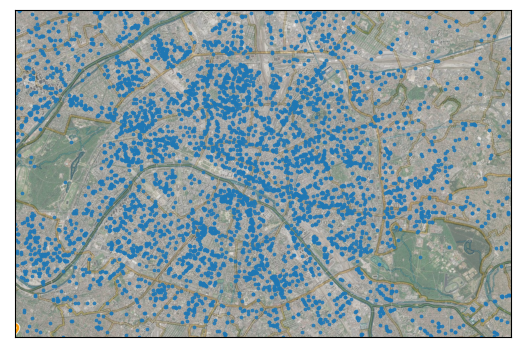

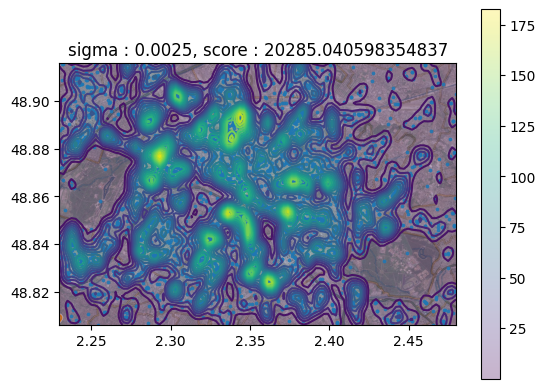

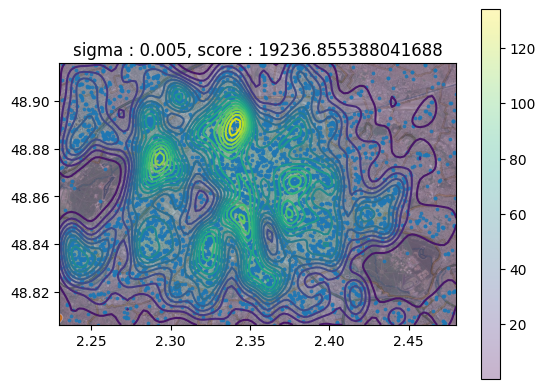

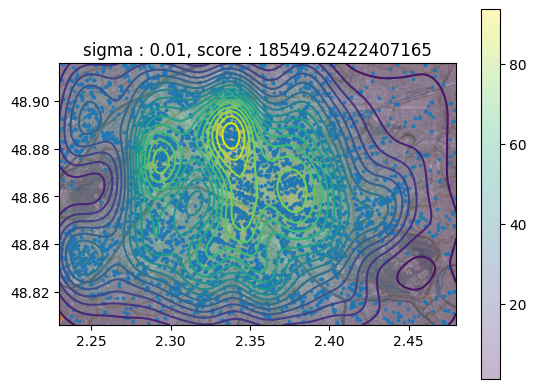

In [518]:
show_img()
# Affiche les POIs
plt.scatter(geo_mat[:,0],geo_mat[:,1],alpha=0.8,s=3)
plt.xticks([])
plt.yticks([])

for sigma in [0.0025, 0.005, 0.01]:
    nc_kernelDensity = KernelDensity(kernel=kernel_gaussian2, sigma=sigma)
    nc_kernelDensity.fit(geo_mat)
    show_density(nc_kernelDensity, geo_mat)
    plt.gca().set_title(f'sigma : {sigma}, score : {nc_kernelDensity.score(geo_mat)}')

In [488]:
kernelUniform.predict(geo_mat).sum()

317136.4361702127

In [298]:
x1.sum

3649.934540999887

In [310]:
np.random.seed(0)  # Fixation de la graine aléatoire pour la reproductibilité
data = np.random.rand(100, 2) 

In [311]:
histo.fit(data)

In [314]:
histo.densite[0].sum()

8.239371973323303

In [313]:
print(histo.fit)

<bound method Histogramme.fit of <__main__.Histogramme object at 0x7fd0795703a0>>


In [359]:
def fit(x):
    #A compléter : apprend l'histogramme de la densité sur x
    densite,edge = np.histogramdd(x,[2] * 2,density = False)
    return densite,edge

In [348]:
fit(data).sum()

AttributeError: 'tuple' object has no attribute 'sum'

In [456]:
a = np.array([[1, 2, 3],
              [4, 5, 6]])

# Calculer la norme euclidienne le long de l'axe 1
normes = np.linalg.norm(a, axis=1)
normes

array([3.74165739, 8.77496439])

In [341]:
def fit2(x):
    #A compléter : apprend l'histogramme de la densité sur x
    densite,edge = np.histogramdd(x,[10] * 2,density = True)
    return densite

In [342]:
xfit2(data).sum()

102.99214966654127

In [351]:
np.sum(x)

100.0

In [330]:
fit(geo_mat).sum()

364993.4541000441

In [350]:
x,y = fit(data)

In [352]:
x.shape

(10, 10)

In [326]:
fit(data).sum()

102.99214966654127

In [353]:
x

array([[1., 0., 1., 1., 1., 0., 2., 0., 1., 1.],
       [1., 1., 1., 1., 0., 0., 3., 1., 2., 2.],
       [0., 5., 1., 0., 0., 1., 0., 1., 0., 1.],
       [0., 0., 1., 1., 2., 0., 1., 0., 0., 1.],
       [1., 0., 1., 0., 0., 1., 2., 1., 3., 0.],
       [3., 0., 2., 0., 2., 3., 1., 1., 0., 2.],
       [0., 1., 3., 0., 2., 1., 2., 0., 0., 0.],
       [3., 1., 1., 1., 3., 1., 0., 0., 2., 2.],
       [3., 0., 1., 1., 0., 2., 1., 1., 0., 0.],
       [1., 0., 0., 2., 1., 0., 4., 1., 1., 0.]])

In [355]:
y

[array([0.01171408, 0.10938006, 0.20704603, 0.30471201, 0.40237799,
        0.50004396, 0.59770994, 0.69537591, 0.79304189, 0.89070786,
        0.98837384]),
 array([0.00469548, 0.10411063, 0.20352578, 0.30294094, 0.40235609,
        0.50177124, 0.60118639, 0.70060155, 0.8000167 , 0.89943185,
        0.99884701])]

In [449]:
test = np.array([[3,4],[2,1],[4,3],[1,3],[3,1],[4,1]])

In [452]:
test < 2

array([[False, False],
       [False,  True],
       [False, False],
       [ True, False],
       [False,  True],
       [False,  True]])

In [454]:
np.nonzero(test<2)

(array([1, 3, 4, 5]), array([1, 0, 1, 1]))

In [473]:
np.tile(np.array([3,4]),(3,1))

array([[3, 4],
       [3, 4],
       [3, 4]])

In [499]:
def kernel_uniform2(x):
    bool_list = (np.abs(x) < 0.5).all(axis=1)
    return np.where(bool_list, 1, 0)

In [501]:
def kernel_gaussian2(x):
    d = x.shape[-1]
    return np.exp(-0.5 * np.linalg.norm(x, axis=1)**2) * (2*np.pi)**(-d/2) 

In [502]:
class KernelDensity2(Density):
    def __init__(self, kernel=None, sigma=0.1):
        Density.__init__(self)
        self.kernel = kernel
        self.sigma = sigma

    def fit(self, x):
        self.x = x

    def predict(self, data):
        # retourne la densité associée à chaque point de data
        n, d = self.x.shape
        l = []
        for x_i in data:
            x_i_stacked = np.vstack([x_i]*n)
            sum_value = self.kernel((x_i_stacked - self.x)/self.sigma).sum()
            l.append(sum_value / (n*self.sigma**d))
        return np.array(l)

In [503]:
kernelUniform2 = KernelDensity(kernel=kernel_uniform2)

# Ajustez le modèle aux données d'entraînement
kernelUniform2.fit(train_data)

# Estimez les densités de probabilité sur les données de test
densities_test2 = kernelUniform2.predict(test_data)

In [505]:
densities_test2.sum()

35780.66496163682

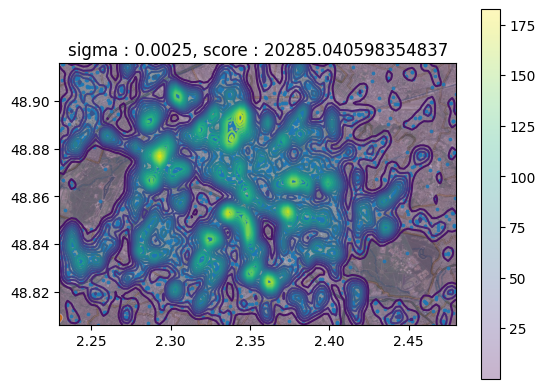

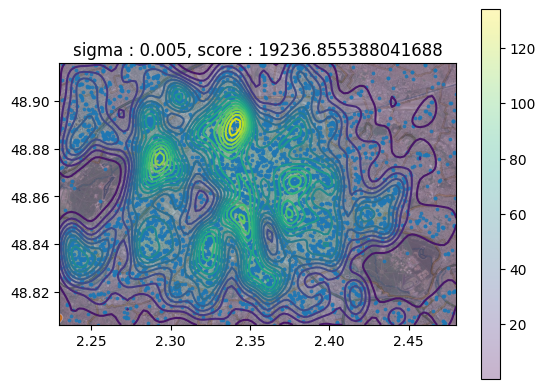

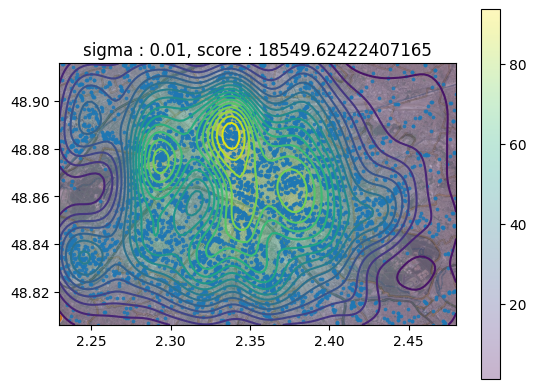

In [513]:
for sigma in [0.0025, 0.005, 0.01]:
    nc_kernelDensity = KernelDensity2(kernel=kernel_gaussian2, sigma=sigma)
    nc_kernelDensity.fit(geo_mat)
    show_density(nc_kernelDensity, geo_mat)
    plt.gca().set_title(f"sigma : {sigma}, score : {nc_kernelDensity.score(geo_mat)}"")